# EDA

In [ ]:
# EDA_Jarvis.py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string
import re
import nltk

from tqdm import trange
from nltk import tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
import warnings
warnings.filterwarnings('ignore')
nltk.download('omw-1.4', quiet=True)
sns.set_style('darkgrid')
plt.rcParams['figure.figsize'] = (17,7)
plt.rcParams['font.size'] = 18
nltk.download('punkt')
nltk.download('punkt_tab')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\adria\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\adria\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [11]:
data=pd.read_csv('Resume.csv')


In [12]:
def word_count(review):
    review_list = review.split()
    return len(review_list)

In [13]:
data['Word_count'] = data['Resume_str'].apply(word_count)
data['Length'] = data['Resume_str'].str.len()
data['mean_word_length'] = data['Resume_str'].map(lambda rev: np.mean([len(word) for word in rev.split()]))
data.head(10)

,ID,Resume_str,Resume_html,Category,Word_count,Length,mean_word_length
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR,674,5442,6.459941
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR,708,5572,6.307910
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR,1017,7720,6.218289
3,27018550,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR,379,2855,5.997361
4,17812897,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR,1206,9172,6.368159
5,11592605,HR GENERALIST Summary Dedic...,"<div class=""fontsize fontface vmargins hmargin...",HR,666,5480,6.735736
6,25824789,HR MANAGER Summary HUMAN RES...,"<div class=""fontsize fontface vmargins hmargin...",HR,637,5250,6.872841
7,15375009,HR MANAGER Professional Summa...,"<div class=""fontsize fontface vmargins hmargin...",HR,1106,9033,6.813743
8,11847784,HR SPECIALIST Summary Posses...,"<div class=""fontsize fontface vmargins hmargin...",HR,796,6720,6.988693
9,32896934,HR CLERK Summary Translates ...,"<div class=""fontsize fontface vmargins hmargin...",HR,716,5978,6.825419


In [14]:
resume_html_value = data.iloc[0]['Resume_html']
print(resume_html_value)

<div class="fontsize fontface vmargins hmargins linespacing pagesize" id="document"> <div class="section firstsection" id="SECTION_NAME500375979" style="
      padding-top:0px;
    "> <div class="paragraph PARAGRAPH_NAME firstparagraph" id="PARAGRAPH_500375979_1_326506904" style="
      padding-top:0px;
    "> <div class="name" itemprop="name"> <span class="field fName" id="500375979FNAM1"> </span> <span> </span> <span class="field" id="500375979LNAM1"> HR ADMINISTRATOR/MARKETING ASSOCIATE

HR ADMINISTRATOR</span> </div> </div> </div> <div class="section" id="SECTION_SUMM500375981" style="
      padding-top:0px;
    "> <div class="heading bottomborder"> <div class="sectiontitle" id="SECTNAME_SUMM500375981"> Summary</div> </div> <div class="paragraph firstparagraph" id="PARAGRAPH_500375981_1_326506917" style="
      padding-top:0px;
    "> <div class="field singlecolumn" id="500375981FRFM1"> <p align="LEFT"> Dedicated Customer Service Manager with 15+ years of experience in Hospitality 

In [15]:
data['mean_sent_length'] = data['Resume_str'].map(lambda rev: np.mean([len(sent) for sent in tokenize.sent_tokenize(rev)]))
data.head(10)

,ID,Resume_str,Resume_html,Category,Word_count,Length,mean_word_length,mean_sent_length
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR,674,5442,6.459941,205.538462
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR,708,5572,6.307910,202.074074
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR,1017,7720,6.218289,199.921053
3,27018550,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR,379,2855,5.997361,164.823529
4,17812897,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR,1206,9172,6.368159,164.236364
5,11592605,HR GENERALIST Summary Dedic...,"<div class=""fontsize fontface vmargins hmargin...",HR,666,5480,6.735736,153.942857
6,25824789,HR MANAGER Summary HUMAN RES...,"<div class=""fontsize fontface vmargins hmargin...",HR,637,5250,6.872841,171.966667
7,15375009,HR MANAGER Professional Summa...,"<div class=""fontsize fontface vmargins hmargin...",HR,1106,9033,6.813743,106.277108
8,11847784,HR SPECIALIST Summary Posses...,"<div class=""fontsize fontface vmargins hmargin...",HR,796,6720,6.988693,119.000000
9,32896934,HR CLERK Summary Translates ...,"<div class=""fontsize fontface vmargins hmargin...",HR,716,5978,6.825419,195.666667


In [16]:
uni=data["Category"].nunique()
print("Numero de categorias:", uni)



Numero de categorias: 24


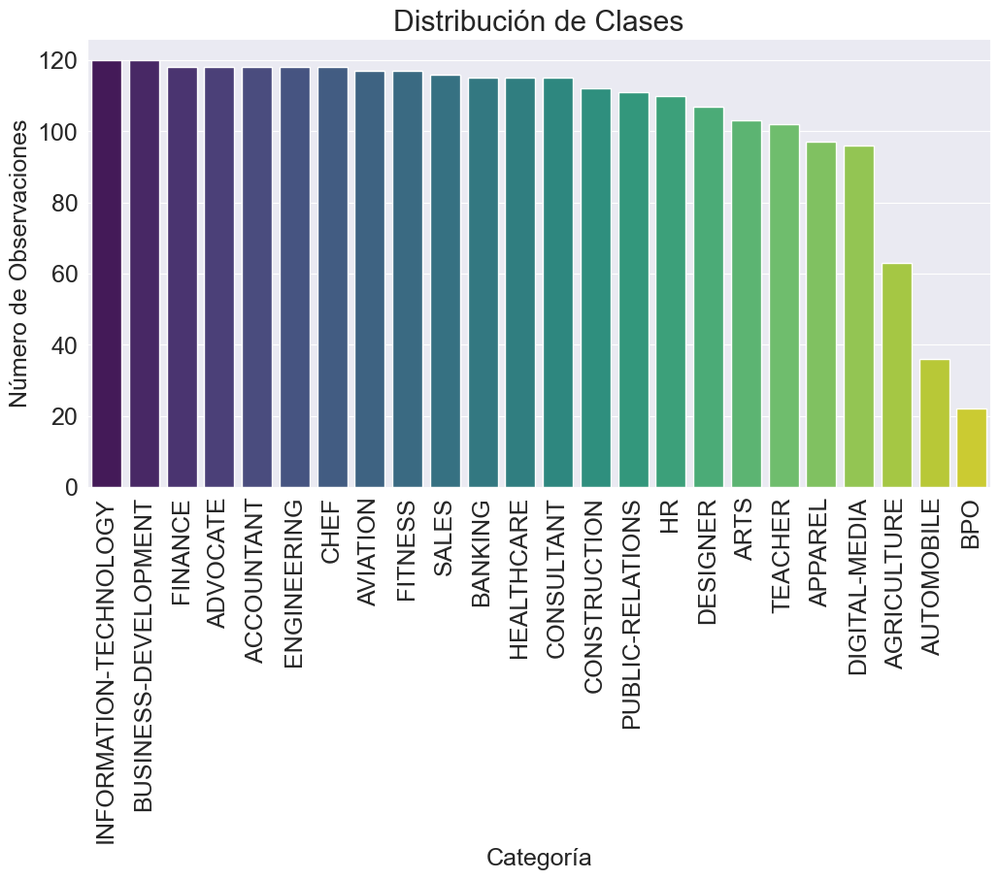

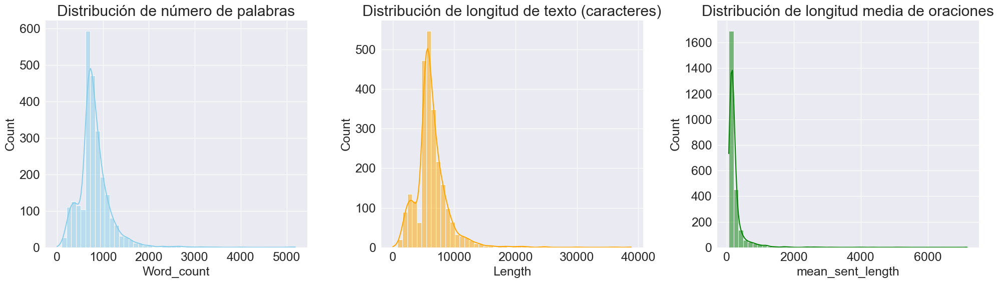

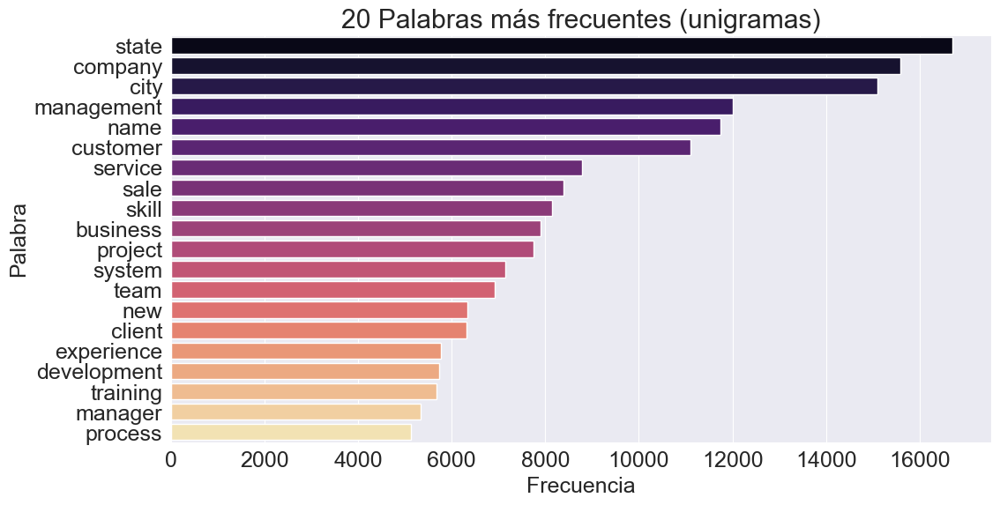

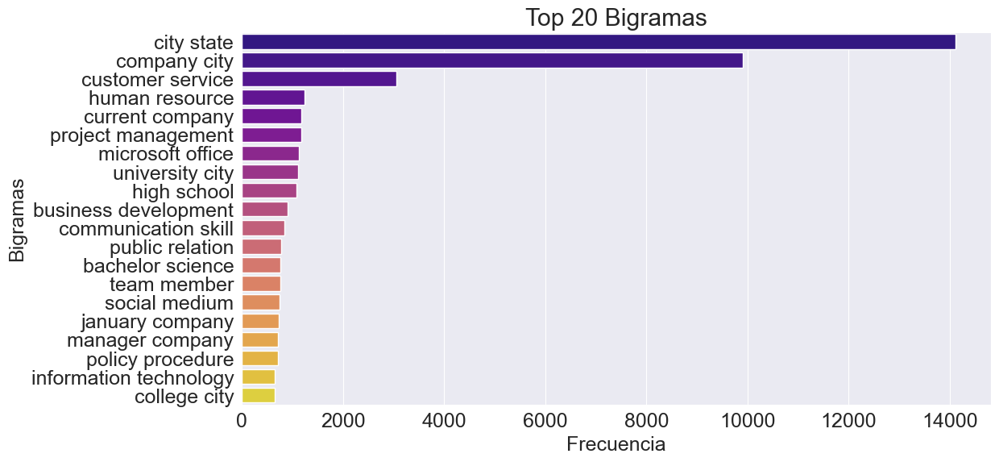

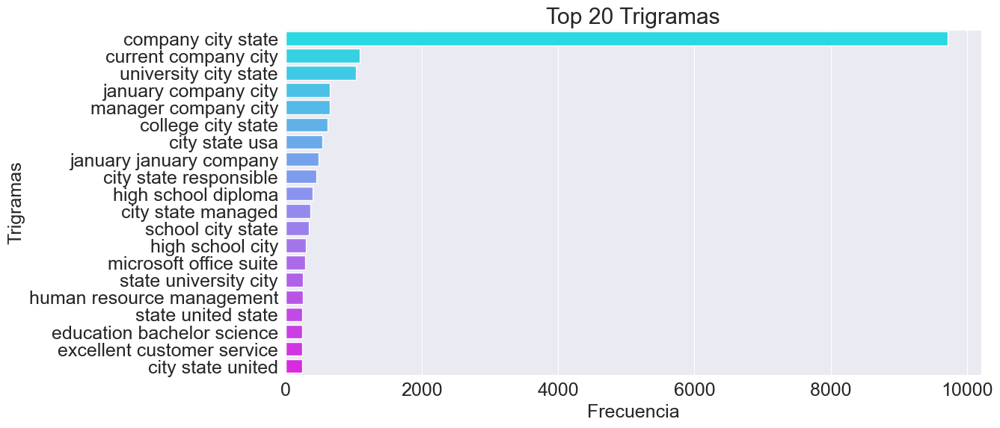

...

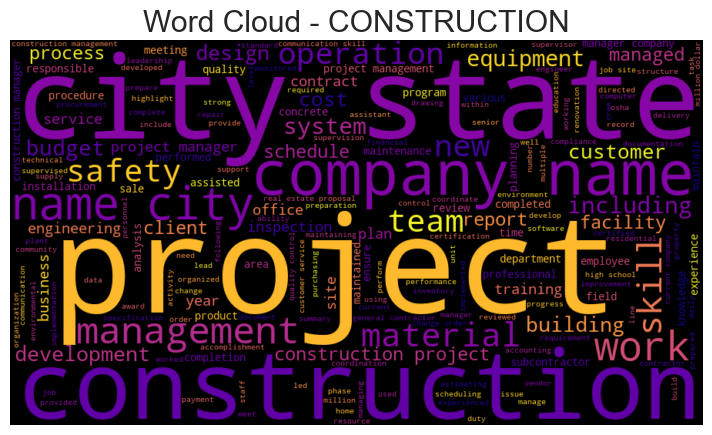

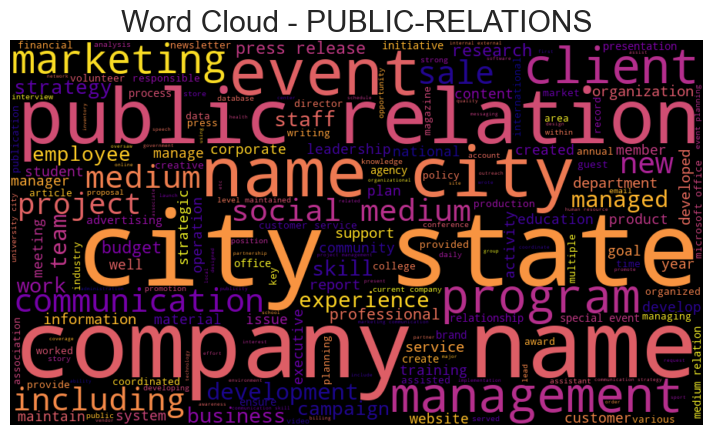

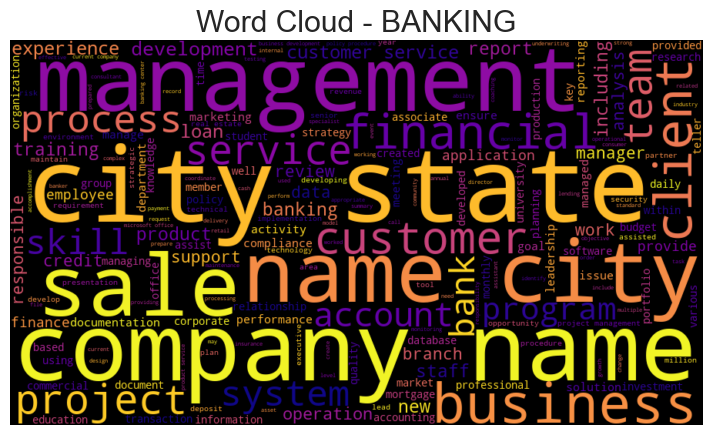

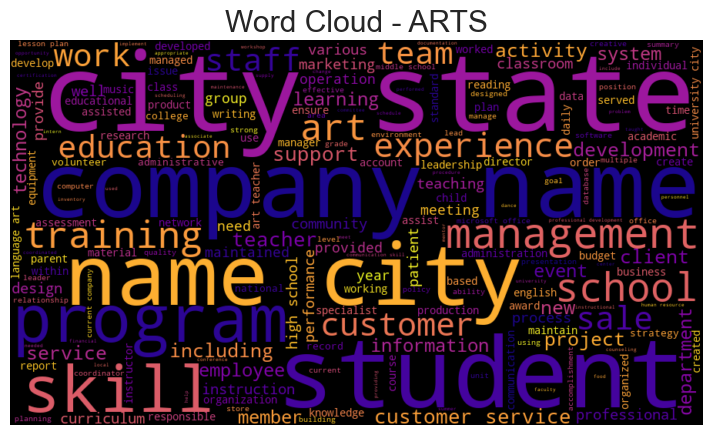

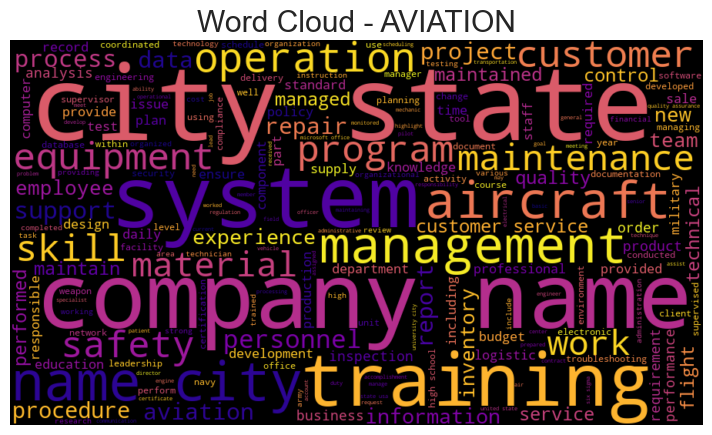

In [17]:
# --- DISTRIBUCIÓN DE CLASES ---
plt.figure(figsize=(12,6))
sns.countplot(data=data, x='Category', order=data['Category'].value_counts().index, palette='viridis')
plt.title("Distribución de Clases")
plt.xticks(rotation=90)
plt.xlabel("Categoría")
plt.ylabel("Número de Observaciones")
plt.show()

# --- DISTRIBUCIÓN DE LONGITUDES DE TEXTO ---
fig, axes = plt.subplots(1, 3, figsize=(20,6))

sns.histplot(data['Word_count'], bins=50, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Distribución de número de palabras')

sns.histplot(data['Length'], bins=50, kde=True, ax=axes[1], color='orange')
axes[1].set_title('Distribución de longitud de texto (caracteres)')

sns.histplot(data['mean_sent_length'], bins=50, kde=True, ax=axes[2], color='green')
axes[2].set_title('Distribución de longitud media de oraciones')

plt.tight_layout()
plt.show()

# --- LIMPIEZA DE TEXTO PARA FRECUENCIAS ---
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def clean_text(text):
    text = text.lower()
    text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub(r'\d+', '', text)
    words = text.split()
    words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words and len(w) > 2]
    return " ".join(words)

data['clean_text'] = data['Resume_str'].apply(clean_text)

# --- PALABRAS MÁS FRECUENTES (UNIGRAMAS) ---
all_words = ' '.join(data['clean_text']).split()
freq_dist = FreqDist(all_words)
common_words = pd.DataFrame(freq_dist.most_common(20), columns=['word', 'count'])

plt.figure(figsize=(12,6))
sns.barplot(data=common_words, x='count', y='word', palette='magma')
plt.title("20 Palabras más frecuentes (unigramas)")
plt.xlabel("Frecuencia")
plt.ylabel("Palabra")
plt.show()

# --- N-GRAMAS (BIGRAMAS y TRIGRAMAS) ---
def get_top_ngrams(corpus, ngram_range=(2,2), n=None):
    vec = CountVectorizer(stop_words='english', ngram_range=ngram_range).fit(corpus)
    bag = vec.transform(corpus)
    sum_words = bag.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

bigrams = get_top_ngrams(data['clean_text'], (2,2), 20)
trigrams = get_top_ngrams(data['clean_text'], (3,3), 20)

# BIGRAMAS
plt.figure(figsize=(12,6))
sns.barplot(x=[x[1] for x in bigrams], y=[x[0] for x in bigrams], palette='plasma')
plt.title("Top 20 Bigramas")
plt.xlabel("Frecuencia")
plt.ylabel("Bigramas")
plt.show()

# TRIGRAMAS
plt.figure(figsize=(12,6))
sns.barplot(x=[x[1] for x in trigrams], y=[x[0] for x in trigrams], palette='cool')
plt.title("Top 20 Trigramas")
plt.xlabel("Frecuencia")
plt.ylabel("Trigramas")
plt.show()

# --- WORDCLOUD GLOBAL ---
from wordcloud import WordCloud

text_all = ' '.join(data['clean_text'])
wc = WordCloud(width=1000, height=600, background_color='black', colormap='viridis').generate(text_all)

plt.figure(figsize=(12,6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud Global")
plt.show()

# --- WORDCLOUD POR CLASE ---
categories = data['Category'].unique()
for cat in categories:
    subset = data[data['Category'] == cat]
    text_cat = ' '.join(subset['clean_text'])
    wc_cat = WordCloud(width=900, height=500, background_color='black', colormap='plasma').generate(text_cat)
    plt.figure(figsize=(10,5))
    plt.imshow(wc_cat, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud - {cat}")
    plt.show()


de estos graficso lo principal que podemos saber es que el las palabras "city" "state" y "company", los bigramas "company city" y city state" y los el trigrama :company city state" se repiten significativamente mas que el resto, especialmente el anteriormente mencionado trigrama, esto nos dice que debe evaluarse su eliminacion para la reduccion de ruido en los tetos ya que es posible que no otorguen informacion de valor para la clasificacion.

otro aspecto a notar es que hay un alto desbalance de clases, por lo cual se debe asignar un sistema de pesos en los modelos para lidiar con esto. 

In [18]:
# Ratio de desbalance
class_counts = data['Category'].value_counts()
imbalance_ratio = class_counts.max() / class_counts.min()
print(f" Ratio de desbalance: {imbalance_ratio:.2f}x")

# Tabla detallada
balance_df = pd.DataFrame({
    'Category': class_counts.index,
    'Count': class_counts.values,
    'Percentage': (class_counts.values / len(data) * 100).round(2),
    'Weight_Suggested': (len(data) / (len(class_counts) * class_counts.values)).round(3)
})
print(balance_df)

 Ratio de desbalance: 5.45x
                  Category  Count  Percentage  Weight_Suggested
0   INFORMATION-TECHNOLOGY    120        4.83             0.862
1     BUSINESS-DEVELOPMENT    120        4.83             0.862
2                  FINANCE    118        4.75             0.877
3                 ADVOCATE    118        4.75             0.877
4               ACCOUNTANT    118        4.75             0.877
5              ENGINEERING    118        4.75             0.877
6                     CHEF    118        4.75             0.877
7                 AVIATION    117        4.71             0.885
8                  FITNESS    117        4.71             0.885
9                    SALES    116        4.67             0.892
10                 BANKING    115        4.63             0.900
11              HEALTHCARE    115        4.63             0.900
12              CONSULTANT    115        4.63             0.900
13            CONSTRUCTION    112        4.51             0.924
14        PU

al evaluar numericamente el desbalance vemos que la clase mayoritaria es 5.45 veces mayor que la minoritaria la cual cuenta con 22 observaciones, por lo cual incluso con los pesos va a ser dificil para los modelos el aprender sobre esta clase, por lo cual se debe evaluar el uso de Data augmentation.

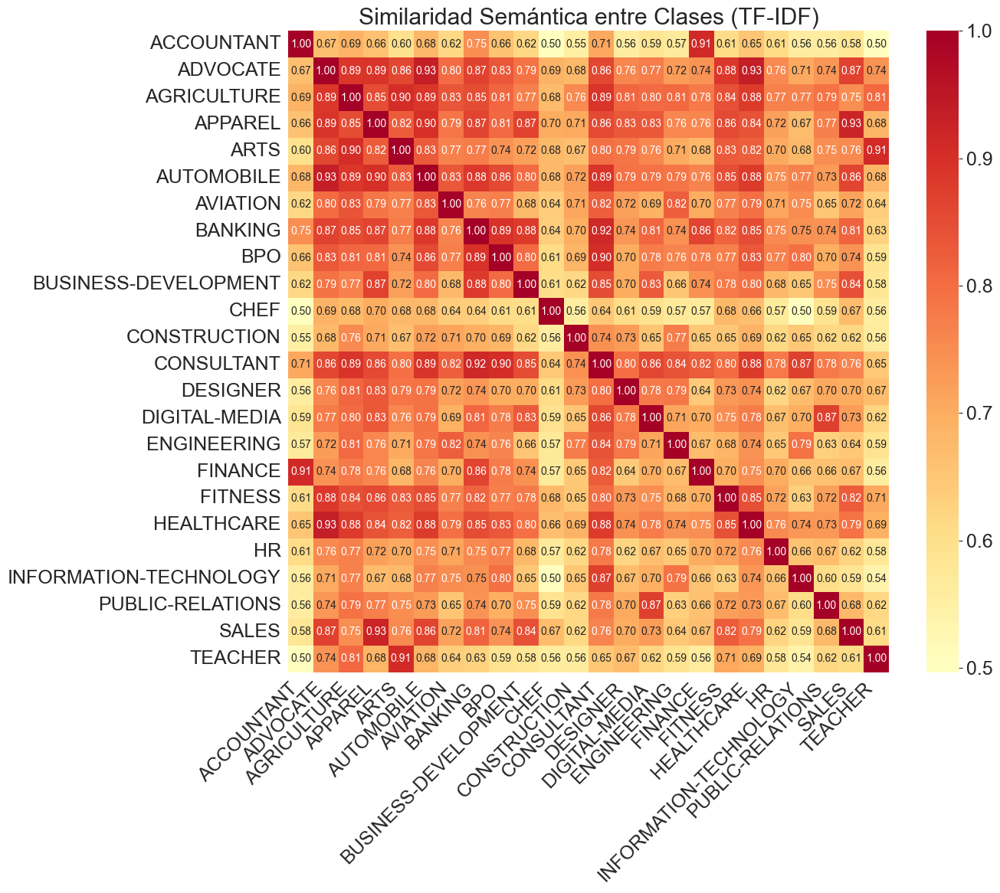

                 Class_1                 Class_2  Similarity
10              ADVOCATE              HEALTHCARE    0.934635
4               ADVOCATE              AUTOMOBILE    0.934255
35               APPAREL                   SALES    0.925204
52               BANKING              CONSULTANT    0.916273
0             ACCOUNTANT                 FINANCE    0.911153
39                  ARTS                 TEACHER    0.907188
59                   BPO              CONSULTANT    0.903334
13           AGRICULTURE                    ARTS    0.902010
26               APPAREL              AUTOMOBILE    0.898300
50               BANKING                     BPO    0.894255
44            AUTOMOBILE              CONSULTANT    0.892772
18           AGRICULTURE              CONSULTANT    0.891546
2               ADVOCATE                 APPAREL    0.889981
1               ADVOCATE             AGRICULTURE    0.889290
14           AGRICULTURE              AUTOMOBILE    0.886494
9               ADVOCATE

In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Representación TF-IDF por clase
class_texts = data.groupby('Category')['clean_text'].apply(lambda x: ' '.join(x))
tfidf = TfidfVectorizer(max_features=1000, ngram_range=(1,2))
class_vectors = tfidf.fit_transform(class_texts)

# Matriz de similaridad
similarity_matrix = cosine_similarity(class_vectors)

# Heatmap
plt.figure(figsize=(14,12))
sns.heatmap(similarity_matrix, 
            xticklabels=class_texts.index, 
            yticklabels=class_texts.index,
            annot=True, fmt='.2f', cmap='RdYlGn_r', center=0.5,annot_kws={"size": 10})
plt.title("Similaridad Semántica entre Clases (TF-IDF)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# Top clases confundibles
confusion_pairs = []
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if similarity_matrix[i,j] > 0.80:  # threshold
            confusion_pairs.append({
                'Class_1': class_texts.index[i],
                'Class_2': class_texts.index[j],
                'Similarity': similarity_matrix[i,j]
            })
df_confusion = pd.DataFrame(confusion_pairs).sort_values('Similarity', ascending=False)
print(df_confusion)

esta tabla nos muestra la similitud semantica calculada de la siguiente manera:  y nos devuelve una lista de las que tienen una similiutd mayor a .80, esto puede ser util para ver los puntos en los cuales es mas probable la confusion de un modelo.

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer

def get_top_keywords_per_class(data, n_keywords=10):
    """Extrae keywords más discriminativas por clase usando TF-IDF"""
    results = {}
    
    for category in data['Category'].unique():
        # Textos de esta clase vs resto
        class_texts = data[data['Category'] == category]['clean_text']
        other_texts = data[data['Category'] != category]['clean_text']
        
        # TF-IDF
        tfidf = TfidfVectorizer(max_features=500, ngram_range=(1,2))
        tfidf.fit(pd.concat([class_texts, other_texts]))
        
        # Vectores de esta clase
        class_vector = tfidf.transform(class_texts).mean(axis=0).A1
        
        # Top features
        top_indices = class_vector.argsort()[-n_keywords:][::-1]
        top_keywords = [(tfidf.get_feature_names_out()[i], class_vector[i]) 
                        for i in top_indices]
        
        results[category] = top_keywords
    
    return results

keywords_per_class = get_top_keywords_per_class(data, n_keywords=15)

# Visualizar para algunas clases
for category in ['INFORMATION-TECHNOLOGY', 'HEALTHCARE', 'BPO', 'AUTOMOBILE']:
    print(f"\n🔑 Keywords distintivas para {category}:")
    for word, score in keywords_per_class[category][:10]:
        print(f"   {word}: {score:.4f}")


🔑 Keywords distintivas para INFORMATION-TECHNOLOGY:
   network: 0.1749
   technology: 0.1641
   system: 0.1641
   information technology: 0.1507
   server: 0.1421
   information: 0.1170
   support: 0.0959
   management: 0.0923
   security: 0.0917
   software: 0.0899

🔑 Keywords distintivas para HEALTHCARE:
   patient: 0.1913
   healthcare: 0.1513
   care: 0.1249
   medical: 0.1178
   health: 0.0912
   state: 0.0897
   customer: 0.0889
   management: 0.0793
   city: 0.0781
   service: 0.0778

🔑 Keywords distintivas para BPO:
   management: 0.1111
   client: 0.1037
   network: 0.0870
   process: 0.0778
   team: 0.0764
   customer: 0.0760
   business: 0.0697
   company: 0.0676
   call: 0.0673
   sale: 0.0661

🔑 Keywords distintivas para AUTOMOBILE:
   customer: 0.1469
   claim: 0.1256
   service: 0.1137
   state: 0.1044
   city: 0.0930
   company: 0.0914
   city state: 0.0900
   customer service: 0.0750
   name: 0.0749
   company name: 0.0729


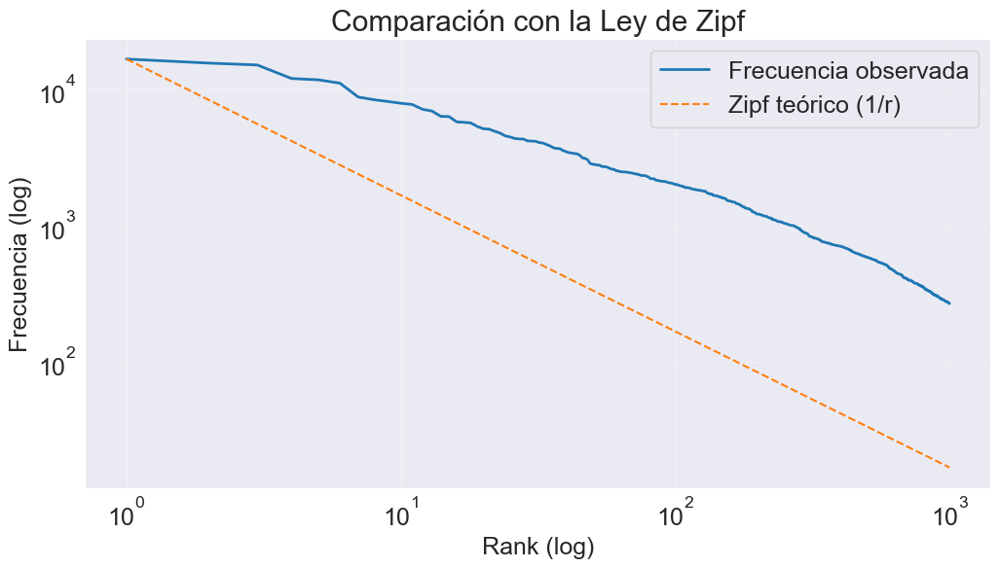

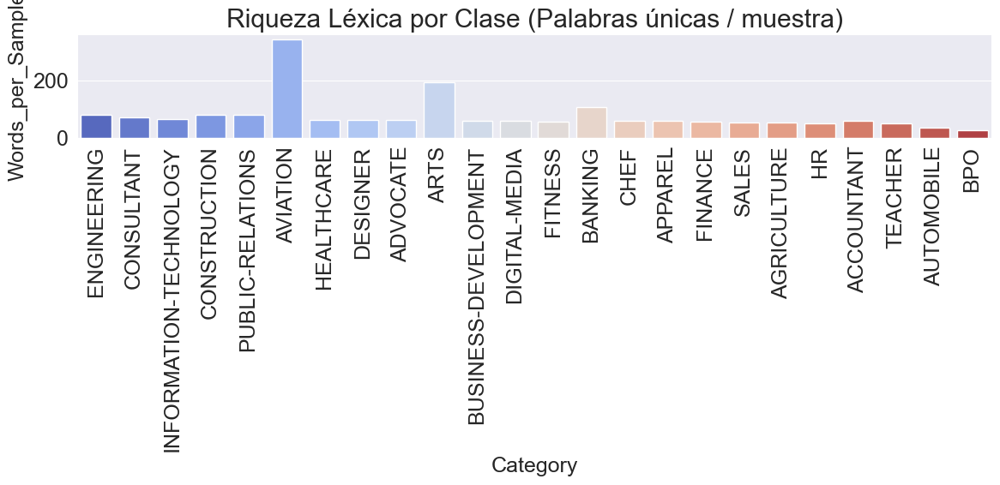

In [41]:
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

# Vocabulario
all_words = ' '.join(data['clean_text']).split()
word_freq = Counter(all_words)
freq_values = np.array(sorted(word_freq.values(), reverse=True))

# Rango (1, 2, 3...)
ranks = np.arange(1, len(freq_values)+1)

# Línea teórica de Zipf: C / r
C = freq_values[0]
zipf_line = C / ranks

# --- Gráfico ---
plt.figure(figsize=(12,6))

plt.loglog(ranks[:1000], freq_values[:1000], label='Frecuencia observada', linewidth=2)
plt.loglog(ranks[:1000], zipf_line[:1000], linestyle='--', label='Zipf teórico (1/r)')

plt.xlabel('Rank (log)')
plt.ylabel('Frecuencia (log)')
plt.title("Comparación con la Ley de Zipf")
plt.legend()
plt.grid(True, alpha=0.3)

plt.show()


# Palabras únicas por clase
vocab_per_class = {}
for cat in data['Category'].unique():
    words = ' '.join(data[data['Category']==cat]['clean_text']).split()
    vocab_per_class[cat] = len(set(words))

vocab_df = pd.DataFrame({
    'Category': vocab_per_class.keys(),
    'Unique_Words': vocab_per_class.values(),
    'Samples': data['Category'].value_counts().values
})
vocab_df['Words_per_Sample'] = vocab_df['Unique_Words'] / vocab_df['Samples']
vocab_df = vocab_df.sort_values('Unique_Words', ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(data=vocab_df, x='Category', y='Words_per_Sample', palette='coolwarm')
plt.xticks(rotation=90)
plt.title("Riqueza Léxica por Clase (Palabras únicas / muestra)")
plt.tight_layout()
plt.show()

La distribución empírica de frecuencias se aleja de la Ley de Zipf, mostrando una caída más lenta y una frecuencia excesiva de terminos recurrentes. Aunque en corpus de lenguaje natural libre esto sería una anomalia, en nuestro caso es un comportamiento esperado, dado que el dataset está compuesto por curriculums.
ya que son textos altamente estructurados y repetitivos, reduce la diversidad lexica

tambien observamos en el segundo grafico que las clases ART, AVIATION y en menor medida BANKING, tienen una redundancia lexica menor, lo cual indica un lenguaje probablemente mas especializado.

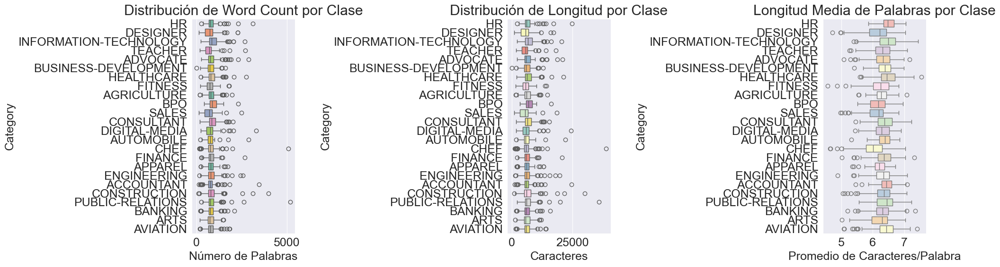


📏 Estadísticas de Longitud por Clase:
                       Word_count                      Length           \
                             mean     std  min   max     mean      std   
Category                                                                 
ACCOUNTANT                 800.01  352.68  143  3459  6293.51  2561.74   
ADVOCATE                   848.50  372.08  266  2888  6575.16  2745.25   
AGRICULTURE                856.29  325.57  192  1970  6605.29  2425.22   
APPAREL                    780.65  290.43  250  1735  6030.12  2178.67   
ARTS                       774.94  293.26  172  1507  6000.37  2253.85   
AUTOMOBILE                 808.19  454.00  213  2889  6321.25  3465.50   
AVIATION                   791.20  308.14  195  1829  6189.21  2342.80   
BANKING                    803.50  294.23  223  2101  6191.19  2151.36   
BPO                        974.23  395.39  420  2310  7317.68  2700.62   
BUSINESS-DEVELOPMENT       775.02  266.35    0  1605  6043.98  2000.40   

In [26]:
# Boxplot de longitudes por clase
fig, axes = plt.subplots(1, 3, figsize=(20,6))

# Word count por clase
sns.boxplot(data=data, y='Category', x='Word_count', ax=axes[0], palette='Set2')
axes[0].set_title('Distribución de Word Count por Clase')
axes[0].set_xlabel('Número de Palabras')

# Length por clase
sns.boxplot(data=data, y='Category', x='Length', ax=axes[1], palette='Set3')
axes[1].set_title('Distribución de Longitud por Clase')
axes[1].set_xlabel('Caracteres')

# Mean word length
sns.boxplot(data=data, y='Category', x='mean_word_length', ax=axes[2], palette='Pastel1')
axes[2].set_title('Longitud Media de Palabras por Clase')
axes[2].set_xlabel('Promedio de Caracteres/Palabra')

plt.tight_layout()
plt.show()

# Estadísticas por clase
length_stats = data.groupby('Category').agg({
    'Word_count': ['mean', 'std', 'min', 'max'],
    'Length': ['mean', 'std'],
    'mean_word_length': ['mean', 'std']
}).round(2)
print("\n📏 Estadísticas de Longitud por Clase:")
print(length_stats)

Conteo de Palabras (Word Count)

La mayoría de las categorías presentan distribuciones altamente sesgadas a la derecha con medianas bajas (entre 500 y 1000 palabras), lo que implica que la mayoría de los documentos son relativamente cortos, pero existen numerosos valores atípicos extremos (hasta ≈5000 palabras) que deben manejarse en el preprocesamiento para evitar sobrecargar modelos. HR y DESIGNER tienen medianas ligeramente más altas, indicando que sus documentos promedio tienden a ser los más extensos, mientras que ARTS y AVIATION tienen las medianas más bajas.

Longitud por Clase (Caracteres)

Esta distribución es altamente correlacionada con el conteo de palabras, manteniendo el sesgo a la derecha y los valores atípicos (hasta ≈25000 caracteres). Las categorías con documentos más largos en palabras, como INFORMATION-TECHNOLOGY y HR, confirman ser las más extensas en caracteres, lo que refuerza la necesidad de técnicas como la truncación o el padding para estandarizar la entrada de datos en modelos secuenciales de PLN.

Longitud Media de Palabras (Promedio de Caracteres/Palabra)

Las distribuciones aquí son las más compactas, indicando consistencia en la longitud de las palabras dentro de cada clase. Las categorías como AVIATION, BANKING y ENGINEERING tienen las medianas más altas (cerca o por encima de 6.5 caracteres), lo que sugiere un lenguaje técnico con palabras más largas o compuestas; en contraste, clases como HR y CHEF tienen palabras promedio más cortas, sugiriendo un lenguaje menos formal o especializado

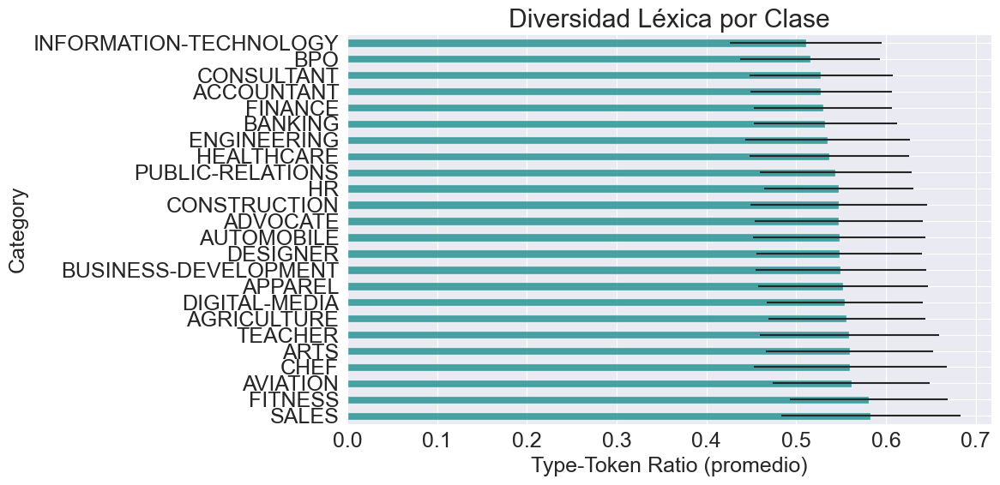


📚 Clases con mayor diversidad léxica (vocabulario más rico):
              mean       std
Category                    
SALES     0.583166  0.100178
FITNESS   0.581124  0.087771
AVIATION  0.561496  0.087516
CHEF      0.560125  0.107681
ARTS      0.559398  0.092854


In [27]:
def calculate_ttr(text):
    """Type-Token Ratio: unique words / total words"""
    words = text.split()
    if len(words) == 0:
        return 0
    return len(set(words)) / len(words)

data['ttr'] = data['clean_text'].apply(calculate_ttr)

# TTR por clase
ttr_by_class = data.groupby('Category')['ttr'].agg(['mean', 'std']).sort_values('mean', ascending=False)

plt.figure(figsize=(12,6))
ttr_by_class['mean'].plot(kind='barh', xerr=ttr_by_class['std'], color='teal', alpha=0.7)
plt.xlabel('Type-Token Ratio (promedio)')
plt.title('Diversidad Léxica por Clase')
plt.tight_layout()
plt.show()

print("\n📚 Clases con mayor diversidad léxica (vocabulario más rico):")
print(ttr_by_class.head(5))

La gráfica de barras horizontal presenta la Diversidad Léxica por Clase, medida por el Type-Token Ratio (TTR) promedio, que es la proporción de palabras únicas (types) sobre el total de palabras (tokens) en el corpus de cada categoría. Las categorías se agrupan en un rango relativamente estrecho (aproximadamente 0.5 a 0.65), indicando que la diversidad general de vocabulario no varía drásticamente entre las clases. Observamos que dominios como INFORMATION-TECHNOLOGY y CONSULTANT presentan el TTR más alto, lo que sugiere un lenguaje con la menor redundancia y mayor variedad de vocabulario. En contraste, categorías como FITNESS y SALES tienen el TTR más bajo, indicando que sus textos utilizan un conjunto de vocabulario más limitado y repetitivo (mayor redundancia léxica)

In [42]:
# Palabras que aparecen en solo 1 clase
word_class_presence = {}
for word in set(all_words):
    classes_with_word = data[data['clean_text'].str.contains(word, regex=False)]['Category'].unique()
    word_class_presence[word] = len(classes_with_word)

unique_words_per_class = {w: c for w, c in word_class_presence.items() if c == 1}

print(f"\n🔬 Palabras únicas a una sola clase: {len(unique_words_per_class):,}")
print(f"   Porcentaje del vocabulario: {len(unique_words_per_class)/vocab_size*100:.2f}%")

# Ejemplos de palabras únicas por clase
for category in data['Category'].unique()[:24]:
    cat_texts = ' '.join(data[data['Category']==category]['clean_text'])
    cat_words = set(cat_texts.split())
    
    # Palabras que solo aparecen en esta clase
    unique_to_class = [w for w in cat_words if word_class_presence.get(w, 0) == 1]
    
    print(f"\n{category}: {len(unique_to_class)} palabras únicas")
    print(f"   Ejemplos: {', '.join(sorted(unique_to_class)[:10])}")


🔬 Palabras únicas a una sola clase: 24,634
   Porcentaje del vocabulario: 54.28%

HR: 889 palabras únicas
   Ejemplos: abraattained, accidentsincidents, accountingpayment, accountsbadging, accross, accruepartners, accused, achievementrecognition, actionscreated, actions​

DESIGNER: 1155 palabras únicas
   Ejemplos: aafet, abbandoned, abbvie, abercrombie, abode, abrasive, accutrac, acquisitor, adhesion, adler

INFORMATION-TECHNOLOGY: 1393 palabras únicas
   Ejemplos: aand, abitility, aboutcom, abuja, academicsbusiness, accesspassword, accessspam, accessusage, accorded, accountmate

TEACHER: 860 palabras únicas
   Ejemplos: aasece, abierto, abilityagility, acclimated, accountabilityearned, activitiescarefully, activitiescompleted, activitiescreated, activitiesencouraged, activitiesincorporated

ADVOCATE: 1047 palabras únicas
   Ejemplos: aacn, abhivyakti, ablls, abns, absorbing, académicos, accidentillness, accountscustomer, achieveexceed, aclaims

BUSINESS-DEVELOPMENT: 1056 palabras ún


Duplicados exactos: 2

Textos con < 30 caracteres: 1

Keywords para clase: HR
[('employee', 0.17462938325854402), ('human resource', 0.12462859028278338), ('human', 0.1160429070655204), ('benefit', 0.09659472920797381), ('resource', 0.09519897032882864), ('management', 0.08378896713234767), ('recruitment', 0.07334207917862769), ('payroll', 0.07111674522666968), ('company', 0.061270821438157666), ('state', 0.05768664357518407)]

Keywords para clase: DESIGNER
[('design', 0.17287760214675257), ('designer', 0.16702892940062616), ('graphic', 0.0884310253904727), ('state', 0.06504774313781014), ('city', 0.06386388220834788), ('city state', 0.05989628731560472), ('interior', 0.059031296585078524), ('company', 0.05487345331264046), ('graphic designer', 0.05387294344963408), ('project', 0.05012547187367286)]

Keywords para clase: INFORMATION-TECHNOLOGY
[('network', 0.12315273820304892), ('system', 0.11645322066386463), ('technology', 0.11611403302192778), ('information technology', 0.106742120

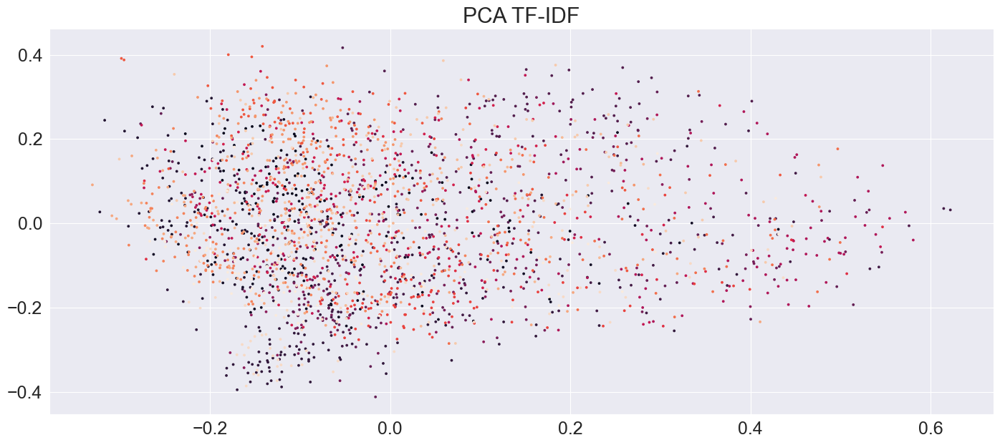

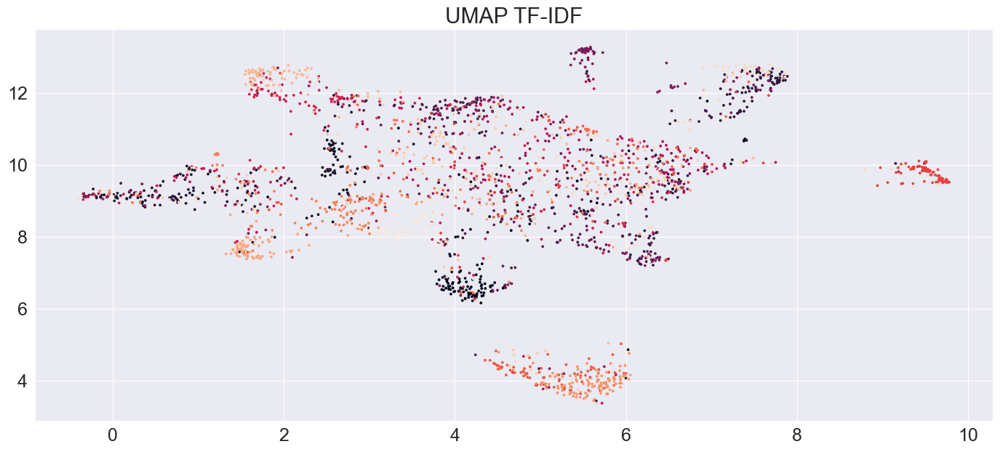

Batches: 100%|██████████| 78/78 [01:18<00:00,  1.01s/it]


Duplicados semánticos: 33


Token indices sequence length is longer than the specified maximum sequence length for this model (835 > 512). Running this sequence through the model will result in indexing errors


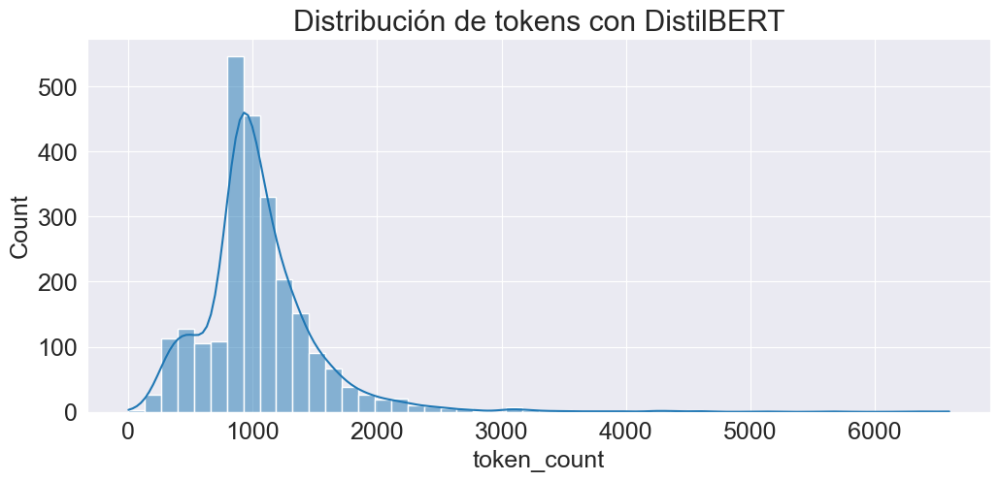


% textos > 512 tokens: 0.8989533011272142
% textos > 256 tokens: 0.9895330112721417
% textos > 128 tokens: 0.999597423510467

========= Resumen General =========
Duplicados exactos: 2
Duplicados casi idénticos: 29
Duplicados semánticos: 33

Textos muy cortos (<30 chars): 1
Textos >512 tokens: 0.8989533011272142
Clases: 24
Desbalance: 5.454545454545454


In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

from sklearn.decomposition import PCA
import umap

from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

from transformers import AutoTokenizer
# 2.1 duplicados exactos
df["duplicated_exact"] = df["Resume_str"].duplicated()
print("\nDuplicados exactos:", df["duplicated_exact"].sum())

# 2.3 textos vacíos o casi vacíos
df["char_len"] = df["Resume_str"].str.len()
print("\nTextos con < 30 caracteres:", (df["char_len"] < 30).sum())




for c in df["Category"].unique()[:5]:
    print("\nKeywords para clase:", c)
    print(get_top_keywords(df, c))

X = tfidf.transform(df["clean_text"])

pca = PCA(n_components=2).fit_transform(X.toarray()[:3000])
plt.scatter(pca[:,0], pca[:,1], c=pd.factorize(df["Category"])[0][:3000], s=3)
plt.title("PCA TF-IDF")
plt.show()

um = umap.UMAP(n_neighbors=20, min_dist=0.1).fit_transform(X[:3000])
plt.scatter(um[:,0], um[:,1], c=pd.factorize(df["Category"])[0][:3000], s=3)
plt.title("UMAP TF-IDF")
plt.show()

model = SentenceTransformer("all-MiniLM-L6-v2")
emb = model.encode(df["Resume_str"], show_progress_bar=True)

sim2 = cosine_similarity(emb)
np.fill_diagonal(sim2, 0)

df["semantic_duplicate"] = (sim2.max(axis=1) > 0.9).astype(int)
print("Duplicados semánticos:", df.semantic_duplicate.sum())

tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")

def count_tokens(text):
    return len(tokenizer.encode(text, truncation=False))

df["token_count"] = df["Resume_str"].apply(count_tokens)

plt.figure(figsize=(12,5))
sns.histplot(df["token_count"], bins=50, kde=True)
plt.title("Distribución de tokens con DistilBERT")
plt.show()

print("\n% textos > 512 tokens:", (df["token_count"] > 512).mean())
print("% textos > 256 tokens:", (df["token_count"] > 256).mean())
print("% textos > 128 tokens:", (df["token_count"] > 128).mean())

print("\n========= Resumen General =========")
print("Duplicados exactos:", df["duplicated_exact"].sum())
print("Duplicados casi idénticos:", df["near_duplicates"].sum())
print("Duplicados semánticos:", df["semantic_duplicate"].sum())
print("\nTextos muy cortos (<30 chars):", (df["char_len"] < 30).sum())
print("Textos >512 tokens:", (df["token_count"] > 512).mean())
print("Clases:", df["Category"].nunique())
print("Desbalance:", class_counts.max()/class_counts.min())



**Análisis de Reduccion de Dimensionalidad**
Las visualizaciones de PCA y UMAP, aplicadas a la representación TF-IDF de los documentos, evalúan la capacidad de los features léxicos para separar las categorías. La gráfica PCA TF-IDF muestra los documentos fuertemente mezclados en una gran nube sin clusters evidentes. Esto indica que las diferencias en la importancia de las palabras (TF-IDF) entre clases no son suficientes para una separación lineal. Aunque UMAP (una técnica no lineal) logra identificar algunas agrupaciones locales más densas en los extremos, la mayor parte de las categorías permanecen intercaladas en la nube central. En conjunto, estos gráficos sugieren que la información léxica de superficie (TF-IDF) es insuficiente para distinguir claramente las clases, y un modelo de clasificación tendrá dificultades basándose únicamente en esta representación.

**Informacion general de calidad de los textos**
El corpus de 24 clases contiene 2 duplicados exactos y 1 texto extremadamente corto (menos de 30 caracteres), lo cual indica la presencia de ruido y una necesidad inmediata de limpieza para prevenir el sesgo del modelo. Además, se observa una alta redundancia de contenido, manifestada en 29 duplicados casi idénticos y 33 duplicados semánticos, lo que requiere una gestión de la superposición de contenido. Un aspecto favorable es que solo el 0.89% de los documentos excede el límite de 512 tokens, lo que implica que la gran mayoría del corpus se ajusta a los límites de longitud de los modelos Transformer, esto nos dice ademas que se debe implementar un sistema de chunking de los textos para evitar la perdida de informacion, tanto en en el data augmentation como en la aplicacion de los modelos.

# Resumen general


El análisis exploratorio revela:

Presencia de términos altamente frecuentes y posiblemente no informativos (e.g., 'company city state').

Desbalance significativo entre clases, con una proporción máxima de 5.45:1.

Alta similitud semántica entre ciertos pares de categorías, lo que anticipa posibles confusiones en la clasificación.

Distribución de longitudes de texto heterogénea, con outliers que requieren manejo (truncamiento/padding).

Baja separabilidad en representaciones léxicas (TF-IDF), sugiriendo la necesidad de embeddings contextuales.